> Stable Diffusion Project for Harvard CS 2420: Computing at Scale (Fall 2024)


---

### **Personalized Stable Diffusion Model Implementation**

In this project, I implemented the personalized Stable Diffusion model introduced in the paper *"DreamBooth: Fine-Tuning Text-to-Image Diffusion Models for Subject-Driven Generation"* by Ruiz et al. (2023). By providing around 5 personal images, the Stable Diffusion model was able to generate images that included personal assets.

In [ ]:
!pip install diffusers==0.30.3      # For working with diffusion models (version 0.30.3)
!pip install transformers==4.44.2   # Provides access to pre-trained models and tokenizers (version 4.44.2)
!pip install matplotlib             # For plotting and visualizing data
!pip install xformers==0.0.28       # Optimizes memory usage for transformer models (version 0.0.28)
!pip install accelerate==0.34.2
!pip install bitsandbytes           # for 8-bit optimizers and GPU memory efficiency
!pip install torch torchvision torchaudio

**Checking GPU Details**

To make sure you're using a GPU and to check its details, you can run the following command:

In [ ]:
!nvidia-smi

Mon Oct 21 20:56:15 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   66C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

**Core Library Imports for Model Operations**

Below are the libraries needed for this notebook, along with the specific versions used:

- **PyTorch version:** 2.4.1+cu121
- **Diffusers version:** 0.30.3
- **Transformers version:** 4.44.2
- **Accelerate version**: 0.34.2  


In [ ]:
import torch
import diffusers
import transformers
import accelerate

# Check and print the PyTorch version and if CUDA is available
# The PyTorch version string usually includes `cuXXX`, where XXX is the CUDA version that PyTorch was compiled with.
print(f"PyTorch version: {torch.__version__}")

# Print the versions of the other libraries
print(f"Diffusers version: {diffusers.__version__}")
print(f"Transformers version: {transformers.__version__}")
print(f"Accelerate version: {accelerate.__version__}")

PyTorch version: 2.4.1+cu121
Diffusers version: 0.30.3
Transformers version: 4.44.2
Accelerate version: 0.34.2


**Other Libraries Imports**
This section includes additional libraries needed for the notebook:

- **Downloading images:**
  - `requests` for handling HTTP requests and downloading images.

- **Byte stream handling:**
  - `BytesIO` for working with byte streams.

- **Image processing:**
  - `PIL` for image processing.

- **Mathematical operations:**
  - `math` for performing mathematical functions.

- **Logging and system utilities:**
  - `logging` for logging messages.
  - `sys` for system-specific parameters and functions.

- **Memory management and optimizers:**
  - `bitsandbytes` for 8-bit optimizers and GPU memory efficiency.

- **Progress bar:**
  - `tqdm` for displaying progress bars during processing.

- **Efficient looping:**
  - `itertools` for creating efficient iterators for looping.

- **File path management:**
  - `Path` from `pathlib` for managing file paths.

- **Transformer models:**
  - `CLIPTextModel` and `CLIPTokenizer` from `transformers` for text processing.
  - `get_scheduler` for managing learning rate schedules.

- **Diffusion models:**
  - `AutoencoderKL`, `UNet2DConditionModel`, and `DDPMScheduler` from `diffusers` for generative models.

- **Accelerate library:**
  - `Accelerator` from `accelerate` for managing distributed training and mixed precision.

- **Memory management and utilities:**
  - `set_seed` from `accelerate.utils` for setting random seeds to ensure reproducibility.
  - `torch.nn.functional` as `F` for providing neural network functionalities.


In [ ]:
import requests
from io import BytesIO
from PIL import Image
import math
import logging
import sys

import bitsandbytes as bnb
from tqdm import tqdm
import itertools

from pathlib import Path

from transformers import CLIPTextModel, CLIPTokenizer, get_scheduler
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler
from accelerate import Accelerator

from accelerate.utils import set_seed
import torch.nn.functional as F

**Model Selection: Stable Diffusion v1.5**

I selected **Stable Diffusion v1.5** for its balanced performance in image quality and resource efficiency.
Please note that when using Stable Diffusion version 2.0, the image resolution should be set to 768, which requires more GPU memory. For versions 1.4 and 1.5, the default resolution remains at 512, making them more memory efficient.


In [ ]:
## Choices
# stable_diffusion_checkpoints = [
#     "stabilityai/stable-diffusion-2",
#     "stabilityai/stable-diffusion-2-base",
#     "CompVis/stable-diffusion-v1-4",
#     "runwayml/stable-diffusion-v1-5"
# ]

pretrained_model_name_or_path = "runwayml/stable-diffusion-v1-5"
# resolution = 768 # for using "stabilityai/stable-diffusion-2" or "stabilityai/stable-diffusion-2-base"
resolution = 512 # for using "CompVis/stable-diffusion-v1-4" or "runwayml/stable-diffusion-v1-5"

In [ ]:
# Personal image selection

# (dog)
# urls = [
#       "https://github.com/google/dreambooth/blob/main/dataset/dog2/00.jpg?raw=true",
#       "https://github.com/google/dreambooth/blob/main/dataset/dog2/01.jpg?raw=true",
#       "https://github.com/google/dreambooth/blob/main/dataset/dog2/02.jpg?raw=true",
#       "https://github.com/google/dreambooth/blob/main/dataset/dog2/03.jpg?raw=true",
#       "https://github.com/google/dreambooth/blob/main/dataset/dog2/04.jpg?raw=true",
# ]

# (shiny sneakers)
urls = ["https://github.com/google/dreambooth/blob/main/dataset/shiny_sneaker/00.jpg?raw=true",
        "https://github.com/google/dreambooth/blob/main/dataset/shiny_sneaker/01.jpg?raw=true",
        "https://github.com/google/dreambooth/blob/main/dataset/shiny_sneaker/02.jpg?raw=true",
        "https://github.com/google/dreambooth/blob/main/dataset/shiny_sneaker/03.jpg?raw=true",
        "https://github.com/google/dreambooth/blob/main/dataset/shiny_sneaker/04.jpg?raw=true",
        ]

**🌐 Where Can I Find and Download Public Personal Images?**

Here are several ways to get public personal images:

1. Visit the [Dreambooth dataset](https://github.com/google/dreambooth/tree/main/dataset), where you will find various personal images. Choose a category you like, and you'll see a few personal images. Click the filename, then right-click the image and select **"Copy Image Link."** Use this link to replace the `urls` list. Ensure the image link ends with `raw=true`.
2. Visit the [Custom Diffusion dataset](https://www.cs.cmu.edu/~custom-diffusion/assets/data.zip). Clicking the link will automatically download a zip file containing personal images. Unzip the file, select the category with personal images you like, and upload them to Colab.
3. Visit the [CustomConcept101](https://github.com/adobe-research/custom-diffusion/blob/main/customconcept101/README.md) and follow the instructions to download the images. There are 101 different personal image categories for you to explore! Please note that the file size is large.
4. Visit [Unsplash](https://unsplash.com/license) and search for the object you want. Prepare around 5 images, then upload them to Colab.
5. You can also use your phone to take some cool photos and upload them.
6. Search for images online, then download and upload them to Colab.


**Visualization Function to Display Images**

This function, `image_grid`, shows images in a grid using `matplotlib`:

- **Inputs**:
  - `images`: List of images to display.
  - `rows`: Number of rows in the grid.
  - `cols`: Number of columns in the grid.

In [ ]:
import matplotlib.pyplot as plt

def image_grid(images: list, rows: int=1, cols: int=2):
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))

    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i])
            ax.axis('off')  # Hide axes for a cleaner look
        else:
            ax.axis('off')  # Hide any extra subplots that don't have images

    plt.tight_layout()
    plt.show()

**Download Images from a URL**

Downloads an image from a URL and converts it to RGB format.

In [ ]:
def download_image(url: str, timeout: int=5):
    try:
        response = requests.get(url, timeout=timeout)
        response.raise_for_status()
    except requests.exceptions.RequestException as e:
        print(f"Error downloading image: {e}")
        return None
    try:
        return Image.open(BytesIO(response.content)).convert("RGB")
    except (IOError, OSError) as e:
        print(f"Error processing image: {e}")
        return None

**Save Images to the `assets/` Folder**

Saves images to the `assets/` folder using the `download_image` function.

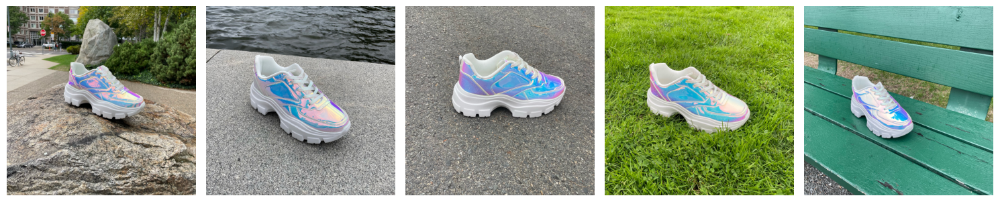

In [ ]:
from pathlib import Path
from PIL import Image
import os

# Define the path to the assets folder (where you've manually uploaded images)
personal_assets_path = "./assets"

# Ensure the assets path exists
personal_assets_path = Path(personal_assets_path)
personal_assets_path.mkdir(parents=True, exist_ok=True)  # Create folder if not exists

# Download images
personal_assets = [image for url in urls if (image := download_image(url)) is not None]
for idx, img in enumerate(personal_assets):
    img.save(personal_assets_path.joinpath(f"{idx}.jpeg")) # Save each image

# Show personal assets
image_grid(personal_assets, rows=1, cols=len(personal_assets))

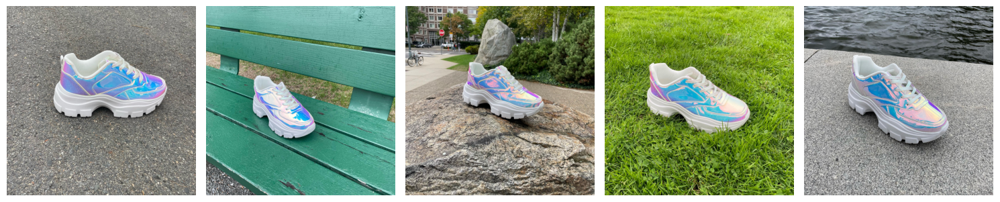

In [ ]:
from pathlib import Path
from PIL import Image
import os

# Define the path to the assets folder (where you've manually uploaded images)
personal_assets_path = "./assets"

# Ensure the assets path exists
personal_assets_path = Path(personal_assets_path)
personal_assets_path.mkdir(parents=True, exist_ok=True)  # Create folder if not exists

# Load all images in the assets folder
personal_assets = []
for file in os.listdir(personal_assets_path):
    if file.endswith((".jpeg", ".jpg", ".png", ".gif")):  # Adjust to the types of images you use
        image_path = personal_assets_path.joinpath(file)
        img = Image.open(image_path)
        personal_assets.append(img)

# Show personal assets
image_grid(personal_assets, rows=1, cols=len(personal_assets))

**The Logging Function**

Records messages during code execution.

In [ ]:
def get_logger(name, log_file=None, level=logging.DEBUG):
    # Create a custom logger
    logger = logging.getLogger(name)

    # Set the default logging level
    logger.setLevel(level)

    # Create a handler for output to the console (stdout)
    console_handler = logging.StreamHandler(sys.stdout)
    console_handler.setLevel(level)

    # Create a formatter and set it for the handler
    formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
    console_handler.setFormatter(formatter)

    # Add the console handler to the logger
    logger.addHandler(console_handler)

    if log_file:
        file_handler = logging.FileHandler(log_file)
        file_handler.setLevel(level)
        file_handler.setFormatter(formatter)
        logger.addHandler(file_handler)

    return logger

**Create the DataLoader**

Creates a DataLoader to read personal assets and the regularization set when `with_prior_preservation` is set to `True`.

In [ ]:
from torchvision import transforms
from torch.utils.data import Dataset

class DreamBoothDataset(Dataset):
    def __init__(
        self,
        instance_data_root,
        instance_prompt,
        tokenizer,
        class_data_root=None,
        class_prompt=None,
        size=512,
        center_crop=False,
    ):
        self.size = size
        self.center_crop = center_crop
        self.tokenizer = tokenizer

        self.instance_data_root = Path(instance_data_root)
        if not self.instance_data_root.exists():
            raise ValueError("Instance images root doesn't exists.")

        self.instance_images_path = list(Path(instance_data_root).iterdir())
        self.num_instance_images = len(self.instance_images_path)
        self.instance_prompt = instance_prompt
        self._length = self.num_instance_images

        if class_data_root is not None:
            self.class_data_root = Path(class_data_root)
            self.class_data_root.mkdir(parents=True, exist_ok=True)
            self.class_images_path = list(Path(class_data_root).iterdir())
            self.num_class_images = len(self.class_images_path)
            self._length = max(self.num_class_images, self.num_instance_images)
            self.class_prompt = class_prompt
        else:
            self.class_data_root = None

        self.image_transforms = transforms.Compose(
            [
                transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
                transforms.CenterCrop(size) if center_crop else transforms.RandomCrop(size),
                transforms.ToTensor(),
                transforms.Normalize([0.5], [0.5]),
            ]
        )

    def __len__(self):
        return self._length

    def __getitem__(self, index):
        example = {}
        instance_image = Image.open(self.instance_images_path[index % self.num_instance_images])
        if not instance_image.mode == "RGB":
            instance_image = instance_image.convert("RGB")
        example["instance_images"] = self.image_transforms(instance_image)
        example["instance_prompt_ids"] = self.tokenizer(
            self.instance_prompt,
            padding="do_not_pad",
            truncation=True,
            max_length=self.tokenizer.model_max_length,
        ).input_ids

        if self.class_data_root:
            class_image = Image.open(self.class_images_path[index % self.num_class_images])
            if not class_image.mode == "RGB":
                class_image = class_image.convert("RGB")
            example["class_images"] = self.image_transforms(class_image)
            example["class_prompt_ids"] = self.tokenizer(
                self.class_prompt,
                padding="do_not_pad",
                truncation=True,
                max_length=self.tokenizer.model_max_length,
            ).input_ids

        return example


class PromptDataset(Dataset):
    def __init__(self, prompt, num_samples):
        self.prompt = prompt
        self.num_samples = num_samples

    def __len__(self):
        return self.num_samples

    def __getitem__(self, index):
        example = {}
        example["prompt"] = self.prompt
        example["index"] = index
        return example

**Collate Function for DataLoader**

This function prepares a batch of data for training by combining instance prompts and images. When `with_prior_preservation` is set to `True`, it also adds class prompts and images to help preserve prior information.

In [ ]:
def collate_fn(examples, tokenizer, with_prior_preservation: bool=False):
    input_ids = [example["instance_prompt_ids"] for example in examples]
    pixel_values = [example["instance_images"] for example in examples]

    # Combine class and instance examples for prior preservation
    if with_prior_preservation:
        input_ids += [example["class_prompt_ids"] for example in examples]
        pixel_values += [example["class_images"] for example in examples]

    pixel_values = torch.stack(pixel_values)
    pixel_values = pixel_values.to(memory_format=torch.contiguous_format).float()

    input_ids = tokenizer.pad(
        {"input_ids": input_ids},
        padding="max_length",
        return_tensors="pt",
        max_length=tokenizer.model_max_length
    ).input_ids

    batch = {
        "input_ids": input_ids,
        "pixel_values": pixel_values,
    }
    return batch

**Personalized Stable Diffusion Settings**

These are the settings for **Personalized Stable Diffusion (SD)**.

- The **special token** (e.g., `sks`) is rarely used by the text encoder, so we update its embedding to "memorize" the patterns of your personal images. You can also choose other tokens like `ktn`, `pll`, or `ucd`.

- **with_prior_preservation = True** helps prevent the model from overfitting. This ensures that the fine-tuned SD model can still generate generic objects (like a generic dog) in addition to your personalized objects (like your personal dog).

- **num_class_images = 20** means that 20 images of generic objects (e.g., generic dogs) are used alongside your personal images during fine-tuning. You can increase this number, but it may lead to longer training times.

- **max_train_steps = 400** sets the training to 400 steps, which should take about 21 minutes on a T4 GPU in Colab.

In [ ]:
# The special text token that is rarely used by the text encoder.
special_token = "sks"  # Options: sks, ktn, pll, ucd

# The name of the object related to the personal images.
# object_name = "man"
object_name = "sneaker"

# The prompt to describe the personal images.
# A basic example: "a photo of [special_token] [object_name]".
# More detailed prompts can improve training quality.
instance_prompt = f"a photo of {special_token} {object_name}"

# The directory where checkpoints and other outputs will be saved.
output_dir = "logs"

# If `with_prior_preservation` is set to True, we create a regularization set to avoid overfitting.
with_prior_preservation = True

# The weight assigned to the prior preservation loss (only applies if `with_prior_preservation` is True).
prior_loss_weight = 0.5

# Folder containing class images for prior preservation (only applies if `with_prior_preservation` is True).
prior_preservation_class_folder = "class_images"

# The prompt used to generate class images for regularization (only applies if `with_prior_preservation` is True).
prior_preservation_class_prompt = f"a photo of {object_name}"

# Minimum number of class images required for prior preservation (only applies if `with_prior_preservation` is True).
num_class_images = 20

max_train_steps = 400
checkpointing_steps = 200
seed = 42 # for reproducibility

# Set batch size. If prior preservation is disabled, use batch size of 2; otherwise, set it to 1.
train_batch_size = 2 if not with_prior_preservation else 1

# Learning rate for the training process.
learning_rate = 5e-06

class Arguments:
    def __init__(self):
        self.pretrained_model_name_or_path = pretrained_model_name_or_path  # (str) Path to the pretrained model
        self.resolution = resolution  # (int) Input resolution for images (default: 512)
        self.instance_data_dir = personal_assets_path  # (str) Directory containing instance images
        self.instance_prompt = instance_prompt  # (str) Template for generating prompts related to instance images
        self.learning_rate = learning_rate  # (float) Learning rate for training
        self.max_train_steps = max_train_steps  # (int) Maximum number of training steps
        self.checkpointing_steps = checkpointing_steps  # (int) Interval (in steps) for saving checkpoints
        self.output_dir = output_dir  # (str) Directory to save checkpoints and output files
        self.train_batch_size = train_batch_size  # (int) Number of samples per batch for training
        self.seed = seed  # (int) Seed for random number generation to ensure reproducibility

        self.mixed_precision = "fp16"  # (str) Use mixed precision (default: "fp16"); choose between "fp16" and "bf16"
        self.gradient_checkpointing = True  # (bool) Use gradient checkpointing to reduce memory usage (default: True)
        self.use_8bit_adam = True  # (bool) Use the 8-bit Adam optimizer for lower memory usage (default: True)

        self.center_crop = True  # (bool) Whether to apply center cropping to images (default: True)
        self.train_text_encoder = False  # (bool) Whether to train the text encoder (default: False)
        self.gradient_accumulation_steps = 2  # (int) Steps to accumulate gradients before backpropagation (default: 2)
        self.max_grad_norm = 1.0  # (float) Maximum value for gradient clipping (default: 1.0)
        self.with_prior_preservation = with_prior_preservation  # (bool) Whether to apply prior preservation loss (default: False)
        self.prior_loss_weight = prior_loss_weight  # (float) Weight for prior preservation loss if enabled (default: 0.5)
        self.class_data_dir = prior_preservation_class_folder if with_prior_preservation else None  # (str or None) Directory for class images, used in prior preservation
        self.class_prompt = prior_preservation_class_prompt if with_prior_preservation else ""  # (str) Prompt for class images if using prior preservation
        self.num_class_images = num_class_images  # (int) Minimum number of class images needed for prior preservation
        self.lr_warmup_steps = 100  # (int) Number of warmup steps for the learning rate scheduler (default: 100)
        self.lr_scheduler = "constant"  # (str) Type of learning rate scheduler (default: "constant")

# Create an instance of Arguments to use
args = Arguments()

**Create Regularization Set for Specified Object**


In [ ]:
import gc
from diffusers import StableDiffusionPipeline

sample_batch_size = 2
if args.with_prior_preservation:
    class_images_dir = Path(args.class_data_dir)
    class_images_dir.mkdir(parents=True, exist_ok=True)
    cur_class_images = len(list(class_images_dir.iterdir()))

    if cur_class_images < args.num_class_images:
        pipeline = StableDiffusionPipeline.from_pretrained(pretrained_model_name_or_path, torch_dtype=torch.float16, safety_checker=None).to("cuda")
        pipeline.set_progress_bar_config(disable=True)

        num_new_images = num_class_images - cur_class_images
        print(f"Number of class images to sample: {num_new_images}.")

        sample_dataset = PromptDataset(args.class_prompt, num_new_images)
        sample_dataloader = torch.utils.data.DataLoader(sample_dataset, batch_size=sample_batch_size)

        for example in tqdm(sample_dataloader, desc="Generating class images"):
            with torch.autocast("cuda"):
                images = pipeline(example["prompt"]).images

            for i, image in enumerate(images):
                image.save(class_images_dir / f"{example['index'][i] + cur_class_images}.jpg")
        pipeline = None
        gc.collect()
        del pipeline
        with torch.no_grad():
          torch.cuda.empty_cache()

**Create Folder for Saving Checkpoints**

Creates the directory specified in `args.output_dir` to save checkpoints. If the folder doesn't exist, it will be automatically created.

In [ ]:
from pathlib import Path
Path(args.output_dir).mkdir(parents=True, exist_ok=True)

**Function for Personalized Stable Diffusion**

This function fine-tunes the Stable Diffusion model using the personal images, allowing it to generate customized content.


In [ ]:
from accelerate.utils import set_seed
import math
from tqdm import tqdm
import torch.nn.functional as F

def finetune_personalized_sd(collate_fn):
    logger = get_logger(__name__)

    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()  # Clear the GPU memory cache

    # Load models and create wrapper for stable diffusion
    text_encoder = CLIPTextModel.from_pretrained(
        pretrained_model_name_or_path,
        subfolder="text_encoder"
    )
    vae = AutoencoderKL.from_pretrained(
        pretrained_model_name_or_path,
        subfolder="vae"
    )
    unet = UNet2DConditionModel.from_pretrained(
        pretrained_model_name_or_path,
        subfolder="unet"
    )
    tokenizer = CLIPTokenizer.from_pretrained(
        pretrained_model_name_or_path,
        subfolder="tokenizer",
    )

    set_seed(args.seed)

    accelerator = Accelerator(
        gradient_accumulation_steps=args.gradient_accumulation_steps,
        mixed_precision=args.mixed_precision,
    )

    if args.train_text_encoder and args.gradient_accumulation_steps > 1 and accelerator.num_processes > 1:
        raise ValueError(
            "Gradient accumulation is not supported when training the text encoder in distributed training. "
            "Please set gradient_accumulation_steps to 1. This feature will be supported in the future."
        )

    vae.requires_grad_(False)
    if not args.train_text_encoder:
        text_encoder.requires_grad_(False)

    if args.gradient_checkpointing:
        unet.enable_gradient_checkpointing()
        if args.train_text_encoder:
            text_encoder.gradient_checkpointing_enable()

    # Use 8-bit Adam for lower memory usage or to fine-tune the model in 16GB GPUs
    if args.use_8bit_adam:
        optimizer_class = bnb.optim.AdamW8bit
    else:
        optimizer_class = torch.optim.AdamW

    params_to_optimize = (
        itertools.chain(unet.parameters(), text_encoder.parameters()) if args.train_text_encoder else unet.parameters()
    )

    optimizer = optimizer_class(
        params_to_optimize,
        lr=args.learning_rate,
    )

    noise_scheduler = DDPMScheduler.from_config(args.pretrained_model_name_or_path, subfolder="scheduler")

    train_dataset = DreamBoothDataset(
        instance_data_root=args.instance_data_dir,
        instance_prompt=args.instance_prompt,
        class_data_root=args.class_data_dir if args.with_prior_preservation else None,
        class_prompt=args.class_prompt,
        tokenizer=tokenizer,
        size=args.resolution,
        center_crop=args.center_crop,
    )

    train_dataloader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size=args.train_batch_size,
        shuffle=True,
        collate_fn=lambda examples: collate_fn(examples, tokenizer, args.with_prior_preservation),
    )

    lr_scheduler = get_scheduler(
        args.lr_scheduler,
        optimizer=optimizer,
        num_warmup_steps=args.lr_warmup_steps * args.gradient_accumulation_steps,
        num_training_steps=args.max_train_steps * args.gradient_accumulation_steps,
    )

    if args.train_text_encoder:
        unet, text_encoder, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
            unet, text_encoder, optimizer, train_dataloader, lr_scheduler
        )
    else:
        unet, optimizer, train_dataloader, lr_scheduler = accelerator.prepare(
            unet, optimizer, train_dataloader, lr_scheduler
        )

    weight_dtype = torch.float32
    if accelerator.mixed_precision == "fp16":
        weight_dtype = torch.float16
    elif accelerator.mixed_precision == "bf16":
        weight_dtype = torch.bfloat16

    vae.to(accelerator.device, dtype=weight_dtype)
    vae.decoder.to("cpu")

    if not args.train_text_encoder:
        text_encoder.to(accelerator.device, dtype=weight_dtype)

    # We need to recalculate our total training steps as the size of the training dataloader may have changed.
    num_update_steps_per_epoch = math.ceil(len(train_dataloader) / args.gradient_accumulation_steps)
    num_train_epochs = math.ceil(args.max_train_steps / num_update_steps_per_epoch)

    total_batch_size = args.train_batch_size * accelerator.num_processes * args.gradient_accumulation_steps

    logger.info("***** Running training *****")
    logger.info(f"  Num examples = {len(train_dataset)}")
    logger.info(f"  Instantaneous batch size per device = {args.train_batch_size}")
    logger.info(f"  Total train batch size (w. parallel, distributed & accumulation) = {total_batch_size}")
    logger.info(f"  Gradient Accumulation steps = {args.gradient_accumulation_steps}")
    logger.info(f"  Total optimization steps = {args.max_train_steps}")

    # Only show the progress bar once on each machine.
    progress_bar = tqdm(range(args.max_train_steps), disable=not accelerator.is_local_main_process)
    progress_bar.set_description("Steps")
    global_step = 0

    for epoch in range(num_train_epochs):
        unet.train()
        for step, batch in enumerate(train_dataloader):
            with accelerator.accumulate(unet):

                # 1. Transform images to latent space
                src_imgs = batch["pixel_values"].to(dtype=weight_dtype) # Get images
                latents = vae.encode(src_imgs).latent_dist.sample() # Extract the latent distribution
                latents = latents * 0.18215 # Scale the latents

                # 2. Generate noise to be added to the latents
                noise = torch.randn_like(latents) # Create random noise
                batch_size, channels, height, width = latents.shape

                # 3. Select a random timestep for each image
                timesteps = torch.randint(
                    0, noise_scheduler.config.num_train_timesteps,
                    (batch_size,),
                    device=latents.device)
                timesteps = timesteps.long()

                # 4. Add noise to the latents based on the noise level at each timestep
                noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

                # 5. Retrieve the text embedding as a condition
                encoder_hidden_states = text_encoder(batch["input_ids"])[0]

                # 6. Predict the noise residual
                model_pred = unet(noisy_latents, timesteps, encoder_hidden_states).sample

                # Get the target for loss depending on the prediction type
                if noise_scheduler.config.prediction_type == "epsilon":
                    target = noise
                elif noise_scheduler.config.prediction_type == "v_prediction":
                    target = noise_scheduler.get_velocity(latents, noise, timesteps)
                else:
                    raise ValueError(f"Unknown prediction type {noise_scheduler.config.prediction_type}")

                if args.with_prior_preservation:
                    # Chunk the noise and model_pred into two parts and compute the loss on each part separately.
                    model_pred, model_pred_prior = torch.chunk(model_pred, 2, dim=0)
                    target, target_prior = torch.chunk(target, 2, dim=0)

                    # 7-1. Compute instance loss
                    loss = F.mse_loss(model_pred.float(), target.float(), reduction="none").mean([1, 2, 3]).mean()

                    # 7-2. Compute prior loss
                    prior_loss = F.mse_loss(model_pred_prior.float(), target_prior.float(), reduction="mean")

                    # 7-3. Add the prior loss to the instance loss
                    loss = loss + args.prior_loss_weight * prior_loss
                else:
                    # 7. Compute instance loss
                    loss = F.mse_loss(model_pred.float(), target.float(), reduction="mean")

                accelerator.backward(loss)

                if accelerator.sync_gradients:
                    accelerator.clip_grad_norm_(unet.parameters(), args.max_grad_norm)

                optimizer.step()
                lr_scheduler.step()
                optimizer.zero_grad()

            # Checks if the accelerator has performed an optimization step behind the scenes
            if accelerator.sync_gradients:
                progress_bar.update(1)
                global_step += 1

                if global_step % args.checkpointing_steps == 0:
                    if accelerator.is_main_process:

                        save_unet_path = Path(args.output_dir).joinpath(f"unet_checkpoint-{global_step}.pth")
                        torch.save(unet.state_dict(), save_unet_path)

            # logs = {"loss": loss.detach().item()}
            logs = {"loss": loss.detach().item(), "lr": lr_scheduler.get_last_lr()[0]}
            progress_bar.set_postfix(**logs)

            if global_step >= args.max_train_steps:
                break

        accelerator.wait_for_everyone()

    # Create the pipeline using using the trained modules and save it.
    if accelerator.is_main_process:

        save_unet_path = Path(args.output_dir).joinpath(f"unet_checkpoint-{global_step}.pth")
        torch.save(unet.state_dict(), save_unet_path)

**Start Fine-Tuning with `Accelerate`**

This command starts running the `finetune_personalized_sd` function using `Accelerate`.

In [ ]:
accelerate.notebook_launcher(finetune_personalized_sd, args=(collate_fn,))

Launching training on one GPU.


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/accelerate/accelerator.py:494: FutureWarning: `torc

2024-10-21 20:57:12,314 - __main__ - INFO - ***** Running training *****


INFO:__main__:***** Running training *****


2024-10-21 20:57:12,317 - __main__ - INFO -   Num examples = 20


INFO:__main__:  Num examples = 20


2024-10-21 20:57:12,322 - __main__ - INFO -   Instantaneous batch size per device = 1


INFO:__main__:  Instantaneous batch size per device = 1


2024-10-21 20:57:12,325 - __main__ - INFO -   Total train batch size (w. parallel, distributed & accumulation) = 2


INFO:__main__:  Total train batch size (w. parallel, distributed & accumulation) = 2


2024-10-21 20:57:12,327 - __main__ - INFO -   Gradient Accumulation steps = 2


INFO:__main__:  Gradient Accumulation steps = 2


2024-10-21 20:57:12,328 - __main__ - INFO -   Total optimization steps = 400


INFO:__main__:  Total optimization steps = 400
Steps:   0%|          | 0/400 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:1399: FutureWarning: `torch.cpu.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cpu', args...)` instead.
  with device_autocast_ctx, torch.cpu.amp.autocast(**cpu_autocast_kwargs), recompute_context:  # type: ignore[attr-defined]
Steps: 100%|██████████| 400/400 [16:21<00:00,  2.45s/it, loss=0.0451, lr=5e-6]


In [ ]:
!nvidia-smi

Mon Oct 21 21:13:33 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   71C    P0              30W /  70W |  10969MiB / 15360MiB |      1%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

**Clear Cache and Collect Garbage for Memory Management**


In [ ]:
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()  # Clear the GPU memory cache

In [ ]:
!nvidia-smi

Mon Oct 21 21:13:34 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   72C    P0              38W /  70W |    439MiB / 15360MiB |     95%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

**Load Pre-trained Stable Diffusion and Fine-tuned UNet Weights**

This step loads the pre-trained Stable Diffusion model and the fine-tuned UNet weights for later inference.

In [ ]:
import os.path as osp
from diffusers import StableDiffusionPipeline, DPMSolverMultistepScheduler

unet_checkpoint_name = "unet_checkpoint-400.pth"
save_unet_weight_path = osp.join(args.output_dir, unet_checkpoint_name)

pipe = StableDiffusionPipeline.from_pretrained(
    args.pretrained_model_name_or_path,
    torch_dtype=torch.float16,
).to("cuda")

unet_state_dict = torch.load(save_unet_weight_path)

print(list(unet_state_dict.keys()))
msg = pipe.unet.load_state_dict(unet_state_dict, strict=False)
print(msg)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)

# Now the pipeline will use the DPMSolverMultistepScheduler
print(f"Scheduler has been updated to: {type(pipe.scheduler)}")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
<ipython-input-22-d82077460078>:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unle

['conv_in.weight', 'conv_in.bias', 'time_embedding.linear_1.weight', 'time_embedding.linear_1.bias', 'time_embedding.linear_2.weight', 'time_embedding.linear_2.bias', 'down_blocks.0.attentions.0.norm.weight', 'down_blocks.0.attentions.0.norm.bias', 'down_blocks.0.attentions.0.proj_in.weight', 'down_blocks.0.attentions.0.proj_in.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.norm1.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.norm1.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.0.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.0.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.norm2.weight', 'down_blocks.0.attentions.0.transformer_blocks.0.norm2.bias', 'down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_q.

**Creating Unique Pictures with Personal Assets**

When `with_prior_preservation` is set to True, the training process uses both the instance data (personalized images we want the model to learn) and the class data (generic images of the same class) to prevent overfitting. This combined dataset ensures that the model receives a balanced view of the specific instance and the general class. The loss function is adjusted to include a regularization term, and this term penalizes the model if it deviates too much from its original ability to generate generic class images. Although a gross oversimplification, we can think of the total loss function $L$ mathematically as:

$L = L_p + \lambda L_g$

where $L_p$ is the loss on personalized images, $L_g$ is the loss on generic images, and $\lambda$ is the loss weight/hyperparameter controlling the influence of $L_g$. If $D_p$ is the dataset of personalized images and $D_g$ is the dataset of generic images, the inclusion of $\lambda L_g$ acts as a counterbalance, preventing the model from becoming too specialized and overfitting to $D_p$.

So by continuously training on class images, the model is in essence reminded of the general features that define the class and that it learned in pre-training, keeping its performance on generic images stable/in-check. Without prior preservation, the model might forget how to generate anything other than the personalized images.


  0%|          | 0/100 [00:00<?, ?it/s]

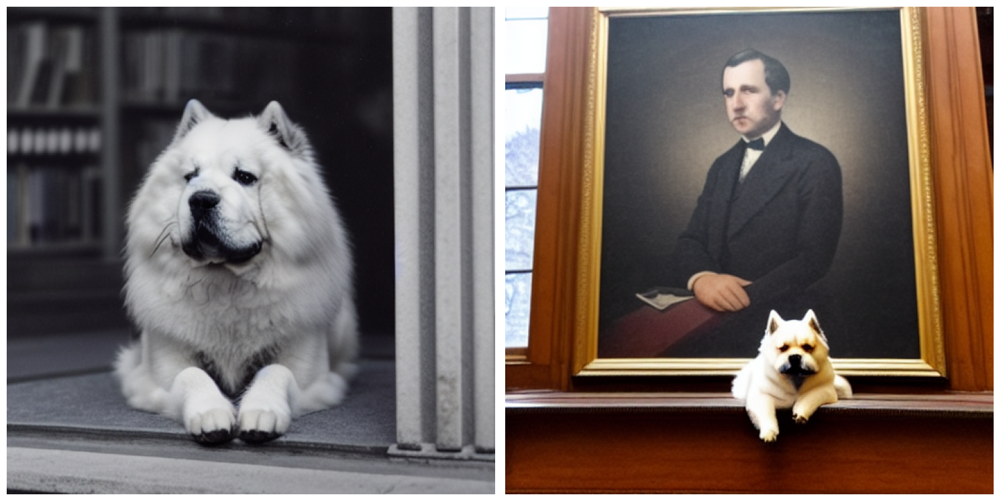

In [ ]:
prompt = "a photo of sks dog in Harvard University's Harry Elkins Widener Memorial Library"
# I used the default personal dog images, special_token = "sks", and object_name = "dog" previously to generate the dog images

num_inference_steps = 100
guidance_scale = 7.5

num_images_per_prompt = 2
num_rows = 1

seed = 0
generator = torch.Generator().manual_seed(seed)

generated_images = pipe(
         prompt,
         num_images_per_prompt=num_images_per_prompt,
         num_inference_steps=num_inference_steps,
         guidance_scale=guidance_scale,
         generator=generator).images

grid = image_grid(generated_images, rows=1, cols=num_images_per_prompt)
grid

  0%|          | 0/100 [00:00<?, ?it/s]

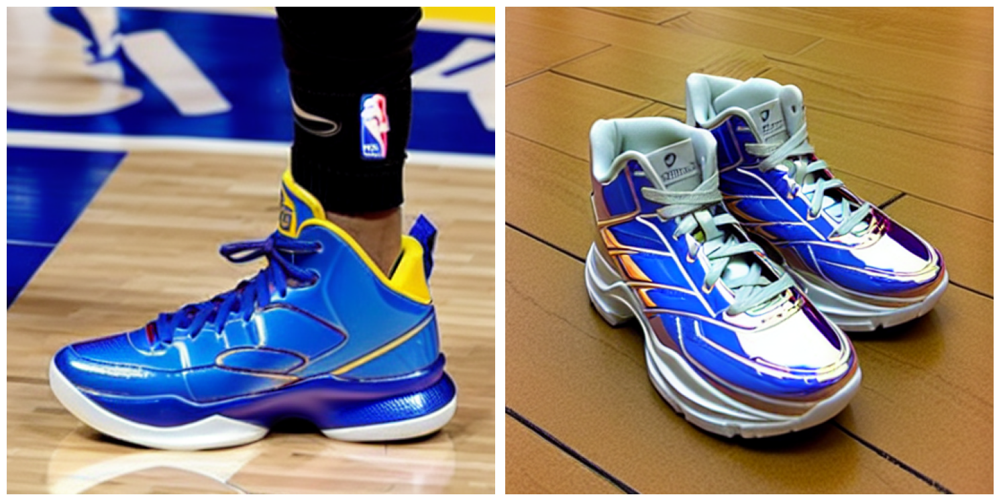

In [ ]:
# PERSONALIZED ASSETS for 5.2 (I re-ran the above cells to produce the below images)

prompt = "a photo of sks sneaker being worn by Stephen Curry in NBA Finals"

num_inference_steps = 100
guidance_scale = 7.5

num_images_per_prompt = 2
num_rows = 1

seed = 0
generator = torch.Generator().manual_seed(seed)

generated_images = pipe(
         prompt,
         num_images_per_prompt=num_images_per_prompt,
         num_inference_steps=num_inference_steps,
         guidance_scale=guidance_scale,
         generator=generator).images

grid = image_grid(generated_images, rows=1, cols=num_images_per_prompt)
grid

  0%|          | 0/100 [00:00<?, ?it/s]

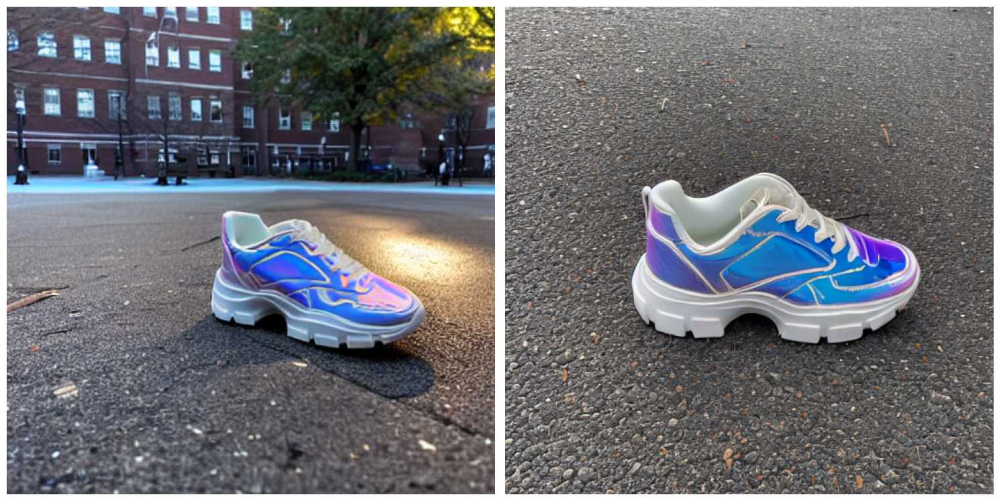

In [ ]:
prompt = "a close-up photo of a sks sneaker on Harvard Yard campus, with evening light casting shadows"

num_inference_steps = 100
guidance_scale = 7.5

num_images_per_prompt = 2
num_rows = 1

seed = 0
generator = torch.Generator().manual_seed(seed)

generated_images = pipe(
         prompt,
         num_images_per_prompt=num_images_per_prompt,
         num_inference_steps=num_inference_steps,
         guidance_scale=guidance_scale,
         generator=generator).images

grid = image_grid(generated_images, rows=1, cols=num_images_per_prompt)
grid

  0%|          | 0/100 [00:00<?, ?it/s]

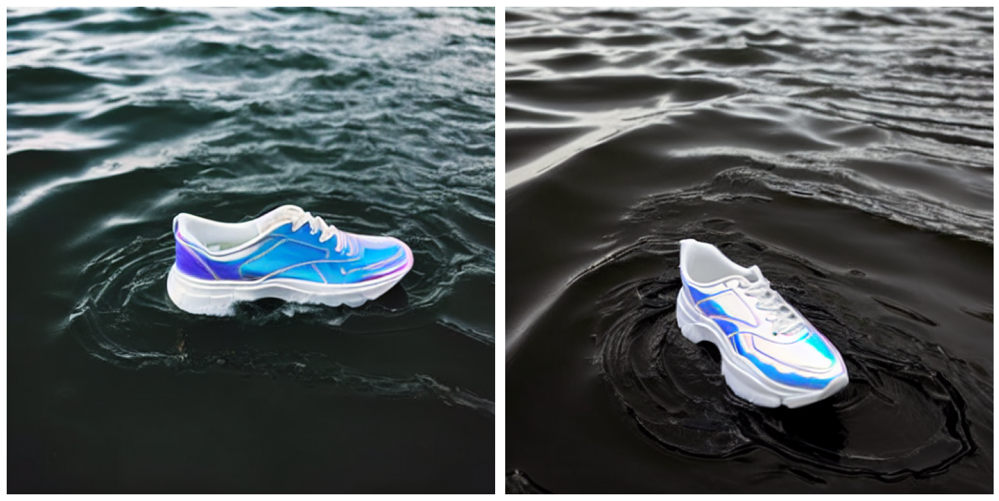

In [ ]:
prompt = "a close-up photo of a sks sneaker floating on waves in the ocean, lonely and all by itself"

num_inference_steps = 100
guidance_scale = 7.5

num_images_per_prompt = 2
num_rows = 1

seed = 0
generator = torch.Generator().manual_seed(seed)

generated_images = pipe(
         prompt,
         num_images_per_prompt=num_images_per_prompt,
         num_inference_steps=num_inference_steps,
         guidance_scale=guidance_scale,
         generator=generator).images

grid = image_grid(generated_images, rows=1, cols=num_images_per_prompt)
grid

  0%|          | 0/100 [00:00<?, ?it/s]

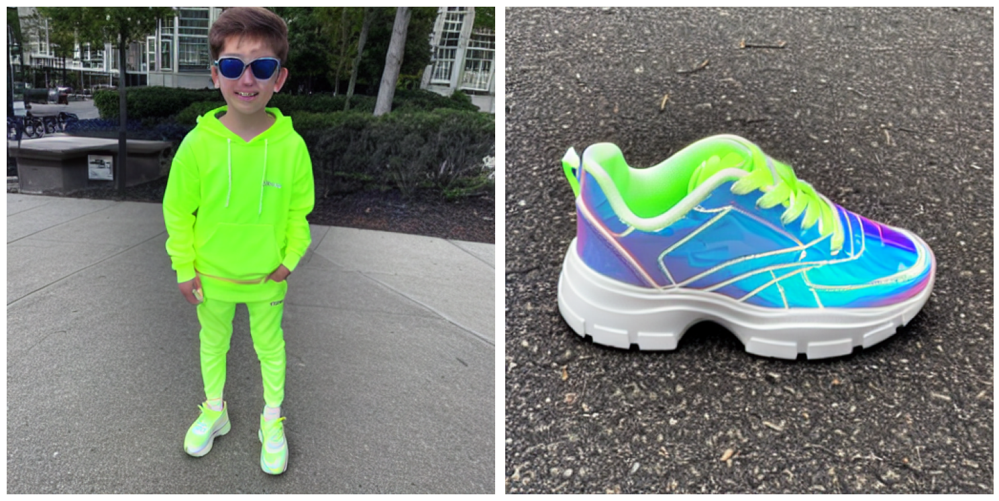

In [ ]:
prompt = "a nice photo of a sks sneaker being worn by a kid wearing highlighter clothing, showing the kid's fully body"
num_inference_steps = 100
guidance_scale = 7.5

num_images_per_prompt = 2
num_rows = 1

seed = 0
generator = torch.Generator().manual_seed(seed)

generated_images = pipe(
         prompt,
         num_images_per_prompt=num_images_per_prompt,
         num_inference_steps=num_inference_steps,
         guidance_scale=guidance_scale,
         generator=generator).images

grid = image_grid(generated_images, rows=1, cols=num_images_per_prompt)
grid

**Create Pictures without Using the Special Token**

It was observed that when I didn't use the sks special token to generate the images, the results less consistently contained sneakers with the shiny pattern observed in the selected set of personal images from the Dreambooth dataset (as expected).

  0%|          | 0/100 [00:00<?, ?it/s]

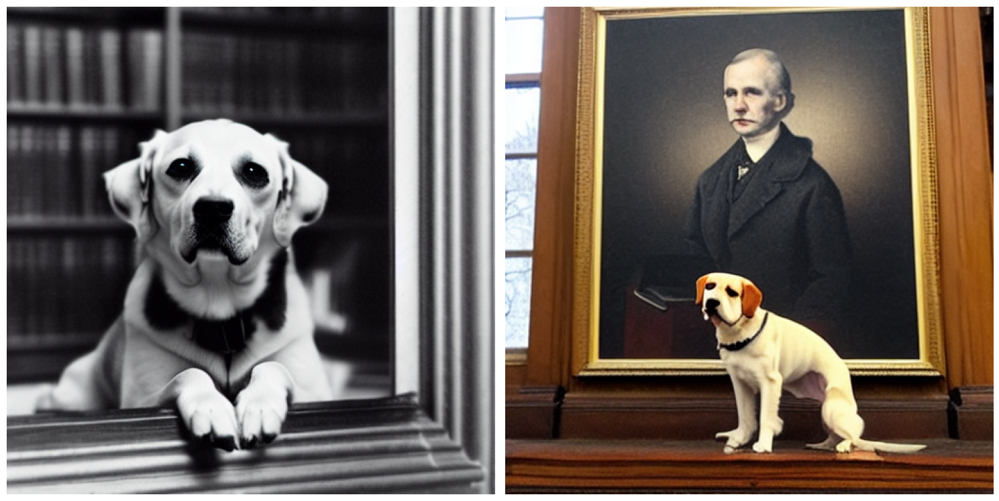

In [ ]:
prompt = "a photo of dog in Harvard University's Harry Elkins Widener Memorial Library"
# I used the default personal dog images, special_token = "sks", and object_name = "dog" previously to generate the dog images

num_inference_steps = 100
guidance_scale = 7.5

num_images_per_prompt = 2
num_rows = 1

seed = 0
generator = torch.Generator().manual_seed(seed)

generated_images = pipe(
         prompt,
         num_images_per_prompt=num_images_per_prompt,
         num_inference_steps=num_inference_steps,
         guidance_scale=guidance_scale,
         generator=generator).images

grid = image_grid(generated_images, rows=1, cols=num_images_per_prompt)
grid

  0%|          | 0/100 [00:00<?, ?it/s]

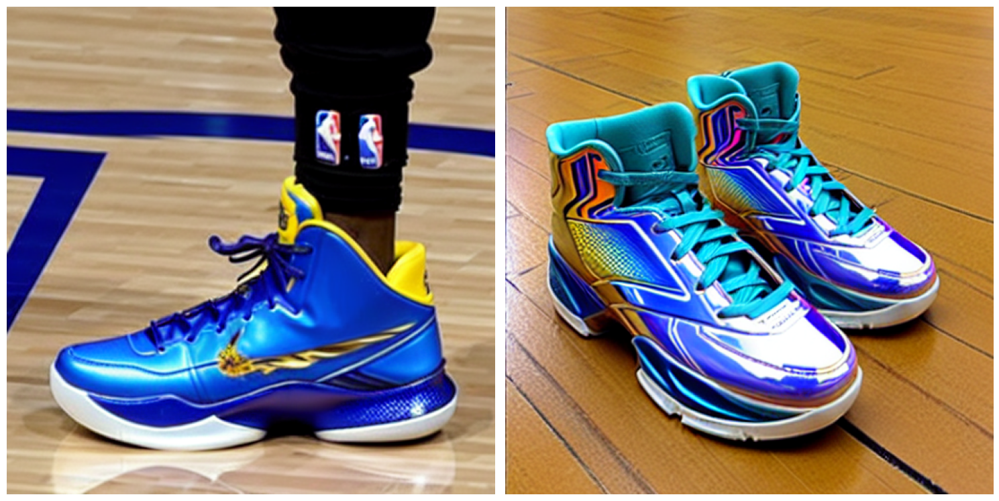

In [ ]:
# PERSONALIZED ASSETS (I re-ran the above cells to produce the below images)

prompt = "a photo of sneaker being worn by Stephen Curry in NBA Finals"

num_inference_steps = 100
guidance_scale = 7.5

num_images_per_prompt = 2
num_rows = 1

seed = 0
generator = torch.Generator().manual_seed(seed)

generated_images = pipe(
         prompt,
         num_images_per_prompt=num_images_per_prompt,
         num_inference_steps=num_inference_steps,
         guidance_scale=guidance_scale,
         generator=generator).images

grid = image_grid(generated_images, rows=1, cols=num_images_per_prompt)
grid

---

### **Controlling Image Partitions with Text Prompts**

In this part, I controlled the partition of the image for generation using text prompts. For example:

- 🔵 The **left/upper partition** of the image is controlled by **<span style="color:#0070C0">text prompt A</span>**.
- 🟢 The **right/lower partition** of the image is controlled by **<span style="color:#50C878">text prompt B</span>**.

<img src="https://drive.google.com/uc?export=view&id=1ZUoVGkQu5CAJkfWcnt2K7Z7bZHaSG8Nc" width="1000"/>



In [ ]:
!pip install diffusers==0.30.3      # For working with diffusion models (version 0.30.3)
!pip install transformers==4.44.2   # Provides access to pre-trained models and tokenizers (version 4.44.2)
!pip install matplotlib             # For plotting and visualizing data
!pip install einops                 # Enables flexible tensor operations
!pip install xformers==0.0.28       # Optimizes memory usage for transformer models (version 0.0.28)
!pip install accelerate
!pip install --upgrade torch torchvision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.7/16.7 MB 46.9 MB/s eta 0:00:00


**Core Library Imports for Model Operations**

Below are the libraries needed for this notebook, along with the specific versions used:

- **PyTorch version:** 2.4.1+cu121
- **Diffusers version:** 0.30.3
- **Transformers version:** 4.44.2
- **xformers version:** 0.0.28

In [ ]:
import torch
import diffusers
import xformers
import transformers

# Check and print the PyTorch version and if CUDA is available
# The PyTorch version string usually includes `cuXXX`, where XXX is the CUDA version that PyTorch was compiled with.
print(f"PyTorch version: {torch.__version__}")

print(f"Diffusers version: {diffusers.__version__}")
print(f"Transformers version: {transformers.__version__}")
print(f"xformers version: {xformers.__version__}")

**Other Libraries Imports**
This section includes additional libraries needed for the notebook:

- **Image processing:**
  - `PIL` for image processing.

- **Progress bar:**
  - `tqdm` for displaying progress bars during processing.

- **Transformer models:**
  - `CLIPTextModel` and `CLIPTokenizer` from `transformers` for text processing.

- **Diffusion models:**
  - `AutoencoderKL`, `UNet2DConditionModel`, and `DDIMScheduler` from `diffusers` for generative models.

- **Memory management and utilities:**
  - `gc` for garbage collection.
  - `random` for generating random values.
  - `rearrange` from `einops` for tensor reshaping.


In [ ]:
import PIL
from PIL import Image

from tqdm import tqdm

from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, DDIMScheduler

import gc
import random
import numpy as np
from einops import rearrange
from typing import List

import matplotlib.pyplot as plt

**Model Selection: Stable Diffusion v1.5**

I used **Stable Diffusion v1.5** for its balanced performance in image quality and resource efficiency.


In [ ]:
## Choices
# stable_diffusion_checkpoints = [
#     "stabilityai/stable-diffusion-2",
#     "stabilityai/stable-diffusion-2-base",
#     "CompVis/stable-diffusion-v1-4",
#     "runwayml/stable-diffusion-v1-5"
# ]

pretrained_model_name_or_path = "runwayml/stable-diffusion-v1-5"

**Memory Efficient Attention using Xformers**

This function implements memory-efficient attention using Xformers for optimized performance with large models.

In [ ]:
def _memory_efficient_attention_xformers(
        module: torch.nn.Module,
        query: torch.Tensor,
        key: torch.Tensor,
        value: torch.Tensor) -> torch.Tensor:
    query = query.contiguous()
    key = key.contiguous()
    value = value.contiguous()
    hidden_states = xformers.ops.memory_efficient_attention(query, key, value,attn_bias=None)
    hidden_states = module.batch_to_head_dim(hidden_states)
    return hidden_states

**Text Embedding Generation from Prompts**

This function encodes a list of text prompts into embeddings using a tokenizer and text encoder.  
It uses float16 for more efficient processing on the GPU.


In [ ]:
def encode_prompts(tokenizer,
                   text_encoder,
                   prompts: list,
                   dtype: torch.dtype=torch.float16,
                   device: str="cuda") -> torch.Tensor:

        '''
        Generate text embeddings from a list of prompts using the tokenizer and text encoder.
        '''
        with torch.no_grad():
            tokens = tokenizer(prompts,
                               max_length=tokenizer.model_max_length,
                               padding=True,
                               truncation=True,
                               return_tensors='pt').input_ids.to(device)
            text_embeddings = text_encoder(tokens,
                                           output_hidden_states=True).last_hidden_state.to(device, dtype=dtype)
        return text_embeddings

**Decoding Latents to Images**

This function decodes latent representations into a list of PIL images using the VAE (Variational Autoencoder). Below is a breakdown of the key steps:

1. `latents = 1 / 0.18215 * latents`: This rescales the latent values by a factor to match the expected input for the VAE decoder.
2. `images = vae.decode(latents).sample`: The VAE decoder processes the latents and returns the decoded image tensors.
3. `images = (images / 2 + 0.5).clamp(0, 1)`: This normalizes the pixel values to fall between 0 and 1.
4. `images = images.cpu().permute(0, 2, 3, 1)`: Moves the channels dimension to the last position to match the standard image format (height, width, channels).
5. `images = (images * 255).round().astype("uint8")`: Scales the pixel values to the 0-255 range and converts them into the uint8 format.
6. `Image.fromarray(image)`: Converts the numpy array into a PIL image format for easy visualization or saving.


In [ ]:
def decode_latents(vae, latents: torch.Tensor) -> List[PIL.Image.Image]:
    latents = 1 / 0.18215 * latents
    with torch.no_grad():
        images = vae.decode(latents).sample
    images = (images / 2 + 0.5).clamp(0, 1)
    images = images.cpu().permute(0, 2, 3, 1).float().numpy()
    images = (images * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

**Horizontal Partitioned Image Controller**


In [ ]:
class HorizontalPartitionedImageController(object):
    def __init__(self,
                 pretrained_model_name_or_path: str,
                 dtype: torch.dtype=torch.float16,
                 device: str="cuda"):

        self.initialize_SD(pretrained_model_name_or_path, dtype, device)

        self.dtype = dtype
        self.device = device

        self.hook_forwards(self.unet)

    def initialize_SD(self,
                      pretrained_model_name_or_path: str,
                      dtype: torch.dtype=torch.float16,
                      device: str="cuda"):

        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()  # Clear the GPU memory cache for every run

        self.tokenizer = CLIPTokenizer.from_pretrained(pretrained_model_name_or_path, subfolder='tokenizer')
        self.text_encoder = CLIPTextModel.from_pretrained(pretrained_model_name_or_path, subfolder='text_encoder').eval().to(device, dtype=dtype)

        self.vae = AutoencoderKL.from_pretrained(pretrained_model_name_or_path, subfolder='vae').eval().to(device, dtype=dtype)
        self.vae.enable_slicing()

        self.unet = UNet2DConditionModel.from_pretrained(pretrained_model_name_or_path, subfolder='unet').eval().to(device, dtype=dtype)
        self.unet.set_use_memory_efficient_attention_xformers(True)

        self.scheduler = DDIMScheduler.from_pretrained(pretrained_model_name_or_path, subfolder="scheduler")

    def __call__(
                self,
                prompts: list,
                negative_prompt: str="",
                img_height: int=512,
                img_width: int=1024,
                batch_size: int=2,
                guidance_scale: float=7.5,
                num_inference_steps: int=50,
                base_ratio: float=0.3,
                seed: int=0,
            ):

        self.set_seed(seed=seed)
        self.latent_height, self.latent_width = img_height // 8, img_width // 8
        self.latent_pixels = self.latent_height * self.latent_width
        self.base_ratio = base_ratio

        '''
        prompts (list): includes both the base prompt and partition-specific prompts
        '''

        # Repeat each prompt (base, partition-specific, and negative) by the batch size
        # Format: [
        #     the_positive_prompt_for_base_view,
        #     the_positive_prompt_for_left_parition,
        #     the_positive_prompt_for_right_parition,
        #     the_negative_prompt
        # ]
        all_prompts = []
        for prompt in prompts:
            all_prompts.extend([prompt] * batch_size)
        all_prompts.extend([negative_prompt] * batch_size)

        # Generate embeddings for the text prompts (base, partition-specific, and negative)
        text_embeddings: torch.Tensor = encode_prompts(
            tokenizer=self.tokenizer,
            text_encoder=self.text_encoder,
            prompts=all_prompts,
            dtype=self.dtype,
            device=self.device)

        # Set the timesteps for the scheduler based on the number of inference steps
        self.scheduler.set_timesteps(num_inference_steps, device=self.device)
        timesteps = self.scheduler.timesteps # (shape) num_inference_steps, (dtype) torch.float16

        latents = torch.randn(batch_size, 4, self.latent_height, self.latent_width).to(self.device, dtype = self.dtype)
        latents = latents * self.scheduler.init_noise_sigma # (dtype) torch.float16
        progress_bar = tqdm(range(num_inference_steps),
                            desc="Generating Image ...",
                            leave=False)

        for _, t in enumerate(timesteps):
            latent_model_input = torch.cat([latents] * 2) # Duplicate latents for both positive and negative prompts
            latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)

            # Predict the noise for the current timestep using the UNet model
            with torch.no_grad():
                noise_pred = self.unet(
                    sample=latent_model_input,
                    timestep=t,
                    encoder_hidden_states=text_embeddings).sample

            # Apply negative Classifier-Free Guidance
            (
                noise_pred_text,
                noise_pred_negative
            ) = noise_pred.chunk(2)
            noise_pred = noise_pred_negative + guidance_scale * (noise_pred_text - noise_pred_negative)

            # Obtain the denoised latents for the current timestep
            latents = self.scheduler.step(noise_pred, t, latents).prev_sample

            progress_bar.update(1)

        images: List[PIL.Image.Image] = decode_latents(
                        vae=self.vae,
                        latents=latents)

        return images

    def cross_attention_hook_forward(self, module):
        def forward(hidden_states: torch.Tensor,
                    encoder_hidden_states: torch.Tensor=None,
                    attention_mask=None):

            visual_features, textual_features = hidden_states, encoder_hidden_states

            # Shape: (batch_size * 2) x num_seqs x (num_heads * num_channels),
            # where the 2 represents the positive and negative prompts
            query = module.to_q(visual_features)
            channels_with_heads = query.shape[-1]


            context = textual_features if textual_features is not None else visual_features
            key = module.to_k(context)
            value = module.to_v(context)

            # Duplicate query for left/right attention:
            # First three queries are attended by the positive prompt (base, left, right),
            # and the fourth is attended by the negative prompt.
            query_attened_by_pos_prompt, query_attened_by_neg_prompt = query.chunk(2)
            query = torch.cat([
                query_attened_by_pos_prompt, # base view
                query_attened_by_pos_prompt, # for left controlling
                query_attened_by_pos_prompt, # for right controlling
                query_attened_by_neg_prompt,
            ], dim=0)

            """
            The `textual_features` tensor should follow this order:

            1. Positive prompt: base view
            2. Positive prompt: text prompt for the left partition
            3. Positive prompt: text prompt for the right partition
            4. Negative prompt

            These prompts are stacked along the `batch` dimension.

            Following this order, the attention mechanism will perform independent operations as follows:

            - Base view query will attend to the base view key and value:
                query_base_view <- key_base_view, value_base_view

            - Left partition query will attend to the left partition key and value:
                query_left_partition <- key_left_partition, value_left_partition

            - Right partition query will attend to the right partition key and value:
                query_right_partition <- key_right_partition, value_right_partition

            - Negative prompt query will attend to the negative prompt key and value:
                query_neg_prompt <- key_neg_prompt, value_neg_prompt
            """

            # Reshape the query, key, and value tensors:
            # Move the head dimension into the batch dimension for efficient attention computation
            # New shape: (batch_size * 2 * num_heads) x num_seqs x channels
            query = module.head_to_batch_dim(query)
            key = module.head_to_batch_dim(key)
            value = module.head_to_batch_dim(value)
            channels = query.shape[-1]

            # Perform attention using memory-efficient xformers
            hidden_states = _memory_efficient_attention_xformers(module, query, key, value)

            # xformers may return output in fp32, so we convert it back to the original data type (matching the query tensor)
            hidden_states = hidden_states.to(query.dtype)

            # Calculate the downsample rate based on the latent pixel count and the query shape
            downsample_rate = int((self.latent_pixels // query.shape[1]) ** 0.5)

            height = self.latent_height // downsample_rate
            width = self.latent_width // downsample_rate

            # Split the hidden states into four parts: base, left, right, and negative prompt
            (
                hidden_states_base,
                hidden_states_left,
                hidden_states_right,
                hidden_states_for_neg_prompt
            ) = hidden_states.chunk(4)
            #we can directly chunk because we know batch_size (dim=0) for all four parts is the same length

            batch_size = hidden_states_left.shape[0]
            hidden_states_left = hidden_states_left.reshape((batch_size, height, width, channels_with_heads))

            hidden_states_right = hidden_states_right.reshape(batch_size, height, width, channels_with_heads)

            # Extract the left half of the width for the left hidden states
            left_width = width//2
            hidden_states_left = hidden_states_left[:,:,:left_width,:]

            # Extract the right half of the width for the right hidden states
            hidden_states_right = hidden_states_right[:,:,left_width:,:]

            # Concatenate the left and right hidden states along the width dimension and reshape the resulting tensor.
            # (a) Concatenate the left and right hidden states along the width dimension
            # (b) Reshape the concatenated tensor back into batch_size x (height * width) x channels
            hidden_states_concat = torch.cat([hidden_states_left, hidden_states_right], dim=2)


            hidden_states_controlled = hidden_states_concat.reshape(batch_size, height * width, channels_with_heads)

            hidden_states_for_pos_prompt: torch.Tensor = (
                hidden_states_controlled * (1. - self.base_ratio) +
                hidden_states_base * self.base_ratio
            )

            hidden_states = torch.cat([
                hidden_states_for_pos_prompt,
                hidden_states_for_neg_prompt
            ])

            # Linear projection layer
            hidden_states = module.to_out[0](hidden_states)
            # Dropout layer
            hidden_states = module.to_out[1](hidden_states)

            return hidden_states

        return forward

    # Overwrite the forward() method for UNet's cross-attention layers
    def hook_forwards(self, root_module: torch.nn.Module):
        for name, module in root_module.named_modules():
            #print(f'{name}:{module.__class__.__name__}')

            if "BasicTransformerBlock" in module.__class__.__name__:
                module.attn2.forward = self.cross_attention_hook_forward(module.attn2)

    # set random seed
    def set_seed(self, seed=0):
        random.seed(seed)
        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.deterministic = True
        torch.use_deterministic_algorithms = True

**Initializing the Horizontal Partitioned Image Controller**

In [ ]:
horizontal_controller = HorizontalPartitionedImageController(
                pretrained_model_name_or_path,
                dtype = torch.float16)

**Generating Images with Horizontal Partitioned Prompts**

In this example, we will generate an image with specific prompts for different partitions of the image.

**Positive Prompt**

The `prompt_layout` is defined as:

```python
prompt_layout = [
    "<base-prompt>",               # The base prompt provides a general or global view for the entire image. This prompt influences the overall tone or theme of the image.
    "<the-prompt-for-left-partition>",   # The prompt for the left partition specifically influences the left side of the image.
    "<the-prompt-for-right-partition>",  # The prompt for the right partition specifically influences the right side of the image.
]
```

- **Base Prompt**:  
  `<base-prompt>`  
  The base prompt provides a general or global view for the entire image. This prompt influences the overall tone or theme of the image.

- **Left Partition Prompt**:  
  `<the-prompt-for-left-partition>`  
  This prompt specifically influences the left side of the image.

- **Right Partition Prompt**:  
  `<the-prompt-for-right-partition>`  
  This prompt specifically influences the right side of the image.

**Negative Prompt**

The `negative_prompt` helps guide the model away from unwanted features:

- **Negative Prompt**:  
  `"worst quality, low quality, bad anatomy, jpeg artifacts"`  
  This discourages the model from generating low-quality features or undesirable artifacts, ensuring a higher-quality output.

**Image Dimensions**

To create a wider image, we use the following dimensions:

- **Image Height**: 512  
- **Image Width**: 1024  

This configuration produces an image that is wider than it is tall.

**Base Ratio**

The `base_ratio` controls the influence of the global/base prompt versus the partition-specific prompts:

- **Base Ratio**: 0.1  
  A lower `base_ratio` (in this case, 0.1) means that the image generation will be mostly influenced by the prompts for the partitions (left and right), while the global base prompt has a smaller impact.

**Guidance Scale**

The `guidance_scale` controls how strongly the model should follow the prompts.


**Drawing the Image with Partitioned Prompts**

Now we are going to generate an image where:

- The **left partition** is controlled by the prompt:  
  "a dog wearing a hat and jacket"

- The **right partition** is controlled by the prompt:  
  "cafe at Times Square, snowy"

<img src="https://drive.google.com/uc?export=view&id=1nLmPZrBYeW2jZLXccWQTPIiEb-Ys_ejz" width="500"/>


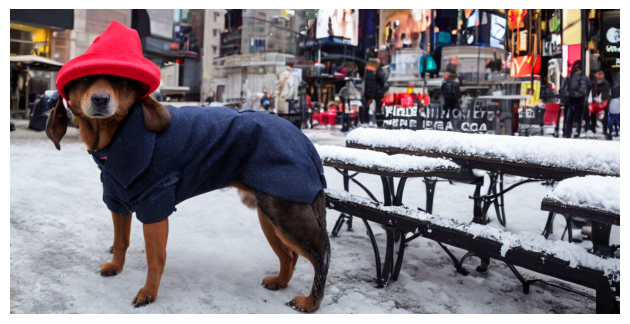

In [ ]:
prompt_layout = [
    "4k, high quality",
    "a dog wearing a hat and jacket",
    "cafe at Times Square, snowy",
]
negative_prompt = "worst quality, low quality, bad anatomy, jpeg artifacts"
generated_images = horizontal_controller(
            prompt_layout,
            negative_prompt,
            img_height = 512,
            img_width = 1024,
            batch_size = 1, # batch size
            num_inference_steps=100, # inference sampling step
            base_ratio=0.1, # the weight assigned to the base prompt. A value of 0 means all prompts are partition-specific, while a value of 1 means all prompts are base.
            guidance_scale=7.5,
            seed=0,
)

plt.imshow(generated_images[0])
plt.axis('off')  # Hide axes
plt.tight_layout()
plt.show()

**Drawing the Image with Partitioned Prompts**

Now we are going to generate an image where:

- The **left partition** is controlled by the prompt:  
  "cows on the farm"

- The **right partition** is controlled by the prompt:  
  "tractor in front of the barn"

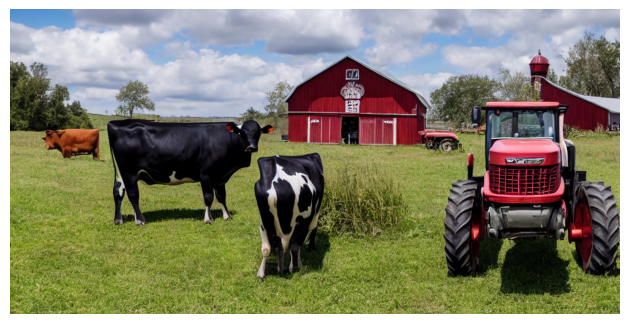

In [ ]:
prompt_layout = [
    "4k, high quality",
    "cows on the farm",
    "tractor in front of the barn",
]
negative_prompt = "worst quality, low quality, bad anatomy, jpeg artifacts"
generated_images = horizontal_controller(
            prompt_layout,
            negative_prompt,
            img_height = 512,
            img_width = 1024,
            batch_size = 1, # batch size
            num_inference_steps=100, # inference sampling step
            base_ratio=0.1, # the weight assigned to the base prompt. A value of 0 means all prompts are partition-specific, while a value of 1 means all prompts are base.
            guidance_scale=7.5,
            seed=0,
)

plt.imshow(generated_images[0])
plt.axis('off')  # Hide axes
plt.tight_layout()
plt.show()

**Drawing the Image with Partitioned Prompts**

Now we are going to generate an image where:

- The **left partition** is controlled by the prompt:  
  "bench under a tree, foliage, fall"

- The **right partition** is controlled by the prompt:  
  "a bird flying above the lake"


Generating Image ...:   0%| | 0/100 [00:00<?
Generating Image ...:   3%| | 3/100 [00:00<0
Generating Image ...:   6%| | 6/100 [00:00<0
Generating Image ...:   9%| | 9/100 [00:00<0
Generating Image ...:  12%| | 12/100 [00:00<
Generating Image ...:  15%|▏| 15/100 [00:00<
Generating Image ...:  18%|▏| 18/100 [00:00<
Generating Image ...:  21%|▏| 21/100 [00:00<
Generating Image ...:  24%|▏| 24/100 [00:00<
Generating Image ...:  27%|▎| 27/100 [00:00<
Generating Image ...:  30%|▎| 30/100 [00:01<
Generating Image ...:  33%|▎| 33/100 [00:01<
Generating Image ...:  36%|▎| 36/100 [00:01<
Generating Image ...:  39%|▍| 39/100 [00:01<
Generating Image ...:  42%|▍| 42/100 [00:01<
Generating Image ...:  45%|▍| 45/100 [00:01<
Generating Image ...:  48%|▍| 48/100 [00:01<
Generating Image ...:  51%|▌| 51/100 [00:01<
Generating Image ...:  54%|▌| 54/100 [00:01<
Generating Image ...:  57%|▌| 57/100 [00:02<
Generating Image ...:  60%|▌| 60/100 [00:02<
Generating Image ...:  63%|▋| 63/100 [00:02<
Generatin

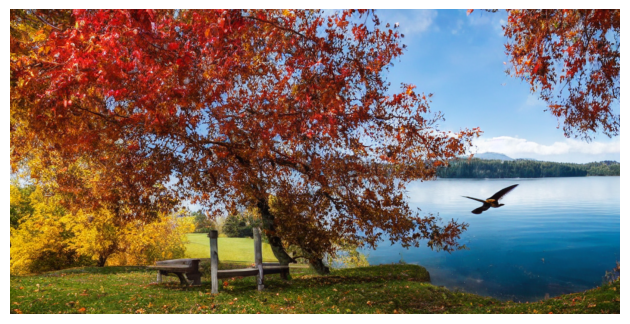

In [ ]:
prompt_layout = [
    "4k, high quality",
    "bench under a tree, foliage, fall",
    "a bird flying above the lake",
]

negative_prompt = "worst quality, low quality, bad anatomy, jpeg artifacts"
generated_images = horizontal_controller(
            prompt_layout,
            negative_prompt,
            img_height = 512,
            img_width = 1024,
            batch_size = 1, # batch size
            num_inference_steps=100, # inference sampling step
            base_ratio=0.1, # the weight assigned to the base prompt. A value of 0 means all prompts are partition-specific, while a value of 1 means all prompts are base.
            guidance_scale=7.5,
            seed=0,
)

plt.imshow(generated_images[0])
plt.axis('off')  # Hide axes
plt.tight_layout()
plt.show()

**Vertical Partitioned Image Controller**


In [ ]:
class VerticalPartitionedImageController(object):
    def __init__(self,
                 pretrained_model_name_or_path: str,
                 dtype: torch.dtype=torch.float16,
                 device: str="cuda"):

        self.initialize_SD(pretrained_model_name_or_path, dtype, device)

        self.dtype = dtype
        self.device = device

        self.hook_forwards(self.unet)

    def initialize_SD(self,
                      pretrained_model_name_or_path: str,
                      dtype: torch.dtype=torch.float16,
                      device: str="cuda"):

        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()  # Clear the GPU memory cache

        self.tokenizer = CLIPTokenizer.from_pretrained(pretrained_model_name_or_path, subfolder='tokenizer')
        self.text_encoder = CLIPTextModel.from_pretrained(pretrained_model_name_or_path, subfolder='text_encoder').eval().to(device, dtype=dtype)

        self.vae = AutoencoderKL.from_pretrained(pretrained_model_name_or_path, subfolder='vae').eval().to(device, dtype=dtype)
        self.vae.enable_slicing()

        self.unet = UNet2DConditionModel.from_pretrained(pretrained_model_name_or_path, subfolder='unet').eval().to(device, dtype=dtype)
        self.unet.set_use_memory_efficient_attention_xformers(True)

        self.scheduler = DDIMScheduler.from_pretrained(pretrained_model_name_or_path, subfolder="scheduler")

    def __call__(
                self,
                prompts: list,
                negative_prompt: str="",
                img_height: int=512,
                img_width: int=1024,
                batch_size: int=2,
                guidance_scale: float=7.5,
                num_inference_steps: int=50,
                base_ratio: float=0.3,
                seed: int=0,
            ):

        self.set_seed(seed=seed)
        self.latent_height, self.latent_width = img_height // 8, img_width // 8
        self.latent_pixels = self.latent_height * self.latent_width
        self.base_ratio = base_ratio

        '''
        prompts (list): includes both the base prompt and partition-specific prompts
        '''

        # Repeat each prompt (base, partition-specific, and negative) by the batch size
        # Format: [
        #     the_positive_prompt_for_base_view,
        #     the_positive_prompt_for_upper_parition,
        #     the_positive_prompt_for_lower_parition,
        #     the_negative_prompt
        # ]
        all_prompts = []
        for prompt in prompts:
            all_prompts.extend([prompt] * batch_size)
        all_prompts.extend([negative_prompt] * batch_size)

        # Generate embeddings for the text prompts (base, partition-specific, and negative)
        text_embeddings: torch.Tensor = encode_prompts(
            tokenizer=self.tokenizer,
            text_encoder=self.text_encoder,
            prompts=all_prompts,
            dtype=self.dtype,
            device=self.device)

        # Set the timesteps for the scheduler based on the number of inference steps
        self.scheduler.set_timesteps(num_inference_steps, device=self.device)
        timesteps = self.scheduler.timesteps # (shape) num_inference_steps, (dtype) torch.float16

        latents = torch.randn(batch_size, 4, self.latent_height, self.latent_width).to(self.device, dtype = self.dtype)
        latents = latents * self.scheduler.init_noise_sigma # (dtype) torch.float16

        progress_bar = tqdm(range(num_inference_steps),
                            desc="Generating Image ...",
                            leave=False)

        for _, t in enumerate(timesteps):
            latent_model_input = torch.cat([latents] * 2) # Duplicate latents for both positive and negative prompts
            latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)

            # Predict the noise for the current timestep using the UNet model
            with torch.no_grad():
                noise_pred = self.unet(
                    sample=latent_model_input,
                    timestep=t,
                    encoder_hidden_states=text_embeddings).sample

            # Apply negative Classifier-Free Guidance
            (
                noise_pred_text,
                noise_pred_negative
            ) = noise_pred.chunk(2)
            noise_pred = noise_pred_negative + guidance_scale * (noise_pred_text - noise_pred_negative)

            # Obtain the denoised latents for the current timestep
            latents = self.scheduler.step(noise_pred, t, latents).prev_sample

            progress_bar.update(1)

        images: List[PIL.Image.Image] = decode_latents(
                        vae=self.vae,
                        latents=latents)

        return images

    def cross_attention_hook_forward(self, module):
        def forward(hidden_states: torch.Tensor,
                    encoder_hidden_states: torch.Tensor=None,
                    attention_mask=None):

            visual_features, textual_features = hidden_states, encoder_hidden_states

            # Shape: (batch_size * 2) x num_seqs x (num_heads * num_channels),
            # where the 2 represents the positive and negative prompts
            query = module.to_q(visual_features)
            channels_with_heads = query.shape[-1]

            context = textual_features if textual_features is not None else visual_features
            key = module.to_k(context)
            value = module.to_v(context)

            # Duplicate query for upper/lower attention:
            # First three queries are attended by the positive prompt (base, upper, lower),
            # and the fourth is attended by the negative prompt.
            query_attened_by_pos_prompt, query_attened_by_neg_prompt = query.chunk(2)
            query = torch.cat([
                query_attened_by_pos_prompt, # base view
                query_attened_by_pos_prompt, # for upper controlling
                query_attened_by_pos_prompt, # for lower controlling
                query_attened_by_neg_prompt,
            ], dim=0)

            """
            The `textual_features` tensor should follow this order:

            1. Positive prompt: base view
            2. Positive prompt: text prompt for the upper partition
            3. Positive prompt: text prompt for the lower partition
            4. Negative prompt

            These prompts are stacked along the `batch` dimension.

            Following this order, the attention mechanism will perform independent operations as follows:

            - Base view query will attend to the base view key and value:
                query_base_view <- key_base_view, value_base_view

            - upper partition query will attend to the upper partition key and value:
                query_upper_partition <- key_upper_partition, value_upper_partition

            - lower partition query will attend to the lower partition key and value:
                query_lower_partition <- key_lower_partition, value_lower_partition

            - Negative prompt query will attend to the negative prompt key and value:
                query_neg_prompt <- key_neg_prompt, value_neg_prompt
            """

            # Reshape the query, key, and value tensors:
            # Move the head dimension into the batch dimension for efficient attention computation
            # New shape: (batch_size * 2 * num_heads) x num_seqs x channels
            query = module.head_to_batch_dim(query)
            key = module.head_to_batch_dim(key)
            value = module.head_to_batch_dim(value)

            # Perform attention using memory-efficient xformers
            hidden_states = _memory_efficient_attention_xformers(module, query, key, value)

            # xformers may return output in fp32, so we convert it back to the original data type (matching the query tensor)
            hidden_states = hidden_states.to(query.dtype)

            # Calculate the downsample rate based on the latent pixel count and the query shape
            downsample_rate = int((self.latent_pixels // query.shape[1]) ** 0.5)

            height = self.latent_height // downsample_rate
            width = self.latent_width // downsample_rate

            # Split the hidden states into four parts: base, upper, lower, and negative prompt.
            (
                hidden_states_base,
                hidden_states_upper,
                hidden_states_lower,
                hidden_states_for_neg_prompt
            ) = hidden_states.chunk(4)

            # Reshape the upper hidden states into batch_size x height x width x channels_with_heads
            batch_size = hidden_states_upper.shape[0]

            hidden_states_upper = hidden_states_upper.reshape((batch_size, height, width, channels_with_heads))

            # Reshape the lower hidden states into batch_size x height x width x channels_with_heads
            hidden_states_lower = hidden_states_lower.reshape(batch_size, height, width, channels_with_heads)

            # Select the upper hidden states based on the height dimension
            upper_height = height//2
            hidden_states_upper = hidden_states_upper[:,:upper_height,:,:]

            # Select the lower hidden states based on the height dimension
            hidden_states_lower = hidden_states_lower[:,upper_height:,:,:]

            # Concatenate the upper and lower hidden states along the height dimension and reshape the resulting tensor.
            # (a) Concatenate the upper and lower hidden states along the height dimension
            # (b) Reshape the concatenated tensor back into batch_size x (height * width) x channels
            hidden_states_controlled = torch.cat([hidden_states_upper, hidden_states_lower], dim=1)
            hidden_states_controlled = hidden_states_controlled.reshape(batch_size, height * width, channels_with_heads)

            hidden_states_for_pos_prompt: torch.Tensor = (
                hidden_states_controlled * (1. - self.base_ratio) +
                hidden_states_base * self.base_ratio
            )

            hidden_states = torch.cat([
                hidden_states_for_pos_prompt,
                hidden_states_for_neg_prompt
            ])

            # Linear projection layer
            hidden_states = module.to_out[0](hidden_states)
            # Dropout layer
            hidden_states = module.to_out[1](hidden_states)

            return hidden_states

        return forward

    # Overwrite the forward() method for UNet's cross-attention layers
    def hook_forwards(self, root_module: torch.nn.Module):
        for name, module in root_module.named_modules():
            if "BasicTransformerBlock" in module.__class__.__name__:
                module.attn2.forward = self.cross_attention_hook_forward(module.attn2)

    # set random seed
    def set_seed(self, seed=0):
        random.seed(seed)
        np.random.seed(seed)
        torch.manual_seed(seed)
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.deterministic = True
        torch.use_deterministic_algorithms = True

**Initializing the Vertical Partitioned Image Controller**

In [ ]:
vertical_controller = VerticalPartitionedImageController(
                pretrained_model_name_or_path,
                dtype = torch.float16)

**Generating Images with Vertical Partitioned Prompts**

In this example, we will generate an image with specific prompts for different partitions of the image.

**Positive Prompt**

The `prompt_layout` is defined as:

```python
prompt_layout = [
    "<base-prompt>",               # The base prompt provides a general or global view for the entire image. This prompt influences the overall tone or theme of the image.
    "<the-prompt-for-upper-partition>",   # The prompt for the upper partition specifically influences the top side of the image.
    "<the-prompt-for-lower-partition>",  # The prompt for the lower partition specifically influences the bottom side of the image.
]
```

- **Base Prompt**:  
  `<base-prompt>`  
  The base prompt provides a general or global view for the entire image. This prompt influences the overall tone or theme of the image.

- **Upper Partition Prompt**:  
  `<the-prompt-for-upper-partition>`  
  This prompt specifically influences the top side of the image.

- **Lower Partition Prompt**:  
  `<the-prompt-for-lower-partition>`  
  This prompt specifically influences the bottom side of the image.


**Image Dimensions**

To create a taller image, we use the following dimensions:

- **Image Height**: 1024  
- **Image Width**: 512

**Drawing the Image with Partitioned Prompts**

Now we are going to generate an image where:

- The **upper partition** is controlled by the prompt:  
  "tall mountains with snow"

- The **lower partition** is controlled by the prompt:  
  "a yellow bus"

<img src="https://drive.google.com/uc?export=view&id=12UKCrqISXyxSTHqzfWrToh1vvTK2BAo6" height="500"/>


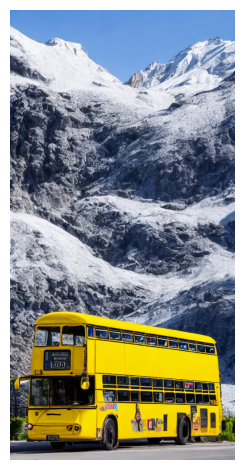

In [ ]:
prompt_layout = [
    "4k, high quality",
    "tall mountains with snow",
    "a yellow bus",
]
negative_prompt = "worst quality, low quality, bad anatomy, jpeg artifacts"
generated_images = vertical_controller(
            prompt_layout,
            negative_prompt,
            img_height = 1024,
            img_width = 512,
            batch_size = 1, # batch size
            num_inference_steps=100, # inference sampling step
            base_ratio=0.1, # the weight assigned to the base prompt. A value of 0 means all prompts are partition-specific, while a value of 1 means all prompts are base.
            guidance_scale=7.5,
            seed=0,
)

generated_images[0].save("top-tallmountains_snow_right-yellowbus.png")

plt.imshow(generated_images[0])
plt.axis('off')  # Hide axes
plt.tight_layout()
plt.show()

**Drawing the Image with Partitioned Prompts**

Now we are going to generate an image where:

- The **upper partition** is controlled by the prompt:  
  "big rock, lightning"

- The **lower partition** is controlled by the prompt:  
  "horses wandering on the grassland"

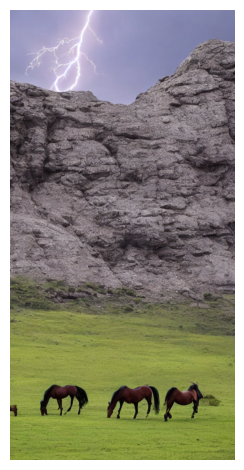

In [ ]:
prompt_layout = [
    "4k, high quality",
    "big rock, lightning",
    "horses wandering on the grassland",
]
negative_prompt = "worst quality, low quality, bad anatomy, jpeg artifacts"
generated_images = vertical_controller(
            prompt_layout,
            negative_prompt,
            img_height = 1024,
            img_width = 512,
            batch_size = 1, # batch size
            num_inference_steps=100, # inference sampling step
            base_ratio=0.1, # the weight assigned to the base prompt. A value of 0 means all prompts are partition-specific, while a value of 1 means all prompts are base.
            guidance_scale=7.5,
            seed=0,
)

plt.imshow(generated_images[0])
plt.axis('off')  # Hide axes
plt.tight_layout()
plt.show()

**Drawing the Image with Partitioned Prompts**

Now we are going to generate an image where:

- The **upper partition** is controlled by the prompt:  
  "a tall house made of sturdy red bricks beneath a blue sky"

- The **lower partition** is controlled by the prompt:  
  "a person sitting on the bench"

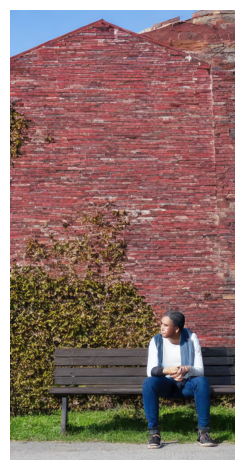

In [ ]:
prompt_layout = [
    "4k, high quality",
    "a tall house made of sturdy red bricks beneath a blue sky",
    "a person sitting on the bench",
]
negative_prompt = "worst quality, low quality, bad anatomy, jpeg artifacts"
generated_images = vertical_controller(
            prompt_layout,
            negative_prompt,
            img_height = 1024,
            img_width = 512,
            batch_size = 1, # batch size
            num_inference_steps=100, # inference sampling step
            base_ratio=0.1, # the weight assigned to the base prompt. A value of 0 means all prompts are partition-specific, while a value of 1 means all prompts are base.
            guidance_scale=7.5,
            seed=0,
)

plt.imshow(generated_images[0])
plt.axis('off')  # Hide axes
plt.tight_layout()
plt.show()